In [14]:
from gluonts.dataset.repository import get_dataset

import numpy as np
import matplotlib.pyplot as plt

import os

In [15]:
folder = 'UNIVARIATE_RESULTS'
dataset_name = 'nn5_weekly'
dataset_folder = f'{folder}/{dataset_name}'
means_folder = f'{dataset_folder}/warm_up_results/means'
vars_folder = f'{dataset_folder}/warm_up_results/vars'
norm_ts_folder = f'{dataset_folder}/warm_up_results/normalized_ts'
means_predictions_folder = f'{dataset_folder}/mean_layer_predictions'

dataset = get_dataset(dataset_name)

In [16]:
means = []
for i in range(len(os.listdir(means_folder))):
    means.append(np.load(f'{means_folder}/test_ts_{i}_means.npy'))
len(means)

111

In [17]:
vars = []
for i in range(len(os.listdir(vars_folder))):
    vars.append(np.load(f'{vars_folder}/test_ts_{i}_vars.npy'))
len(vars)

111

In [18]:
norm_ts = []
for i in range(len(os.listdir(norm_ts_folder))):
    norm_ts.append(np.load(f'{norm_ts_folder}/test_ts_{i}_normalized.npy'))
len(norm_ts)

111

In [19]:
predictions = []
for i in range(len(os.listdir(means_predictions_folder))):
    predictions.append(np.load(f'{means_predictions_folder}/test_ts_{i}_mean_layer_preds.npy'))
len(predictions)

111

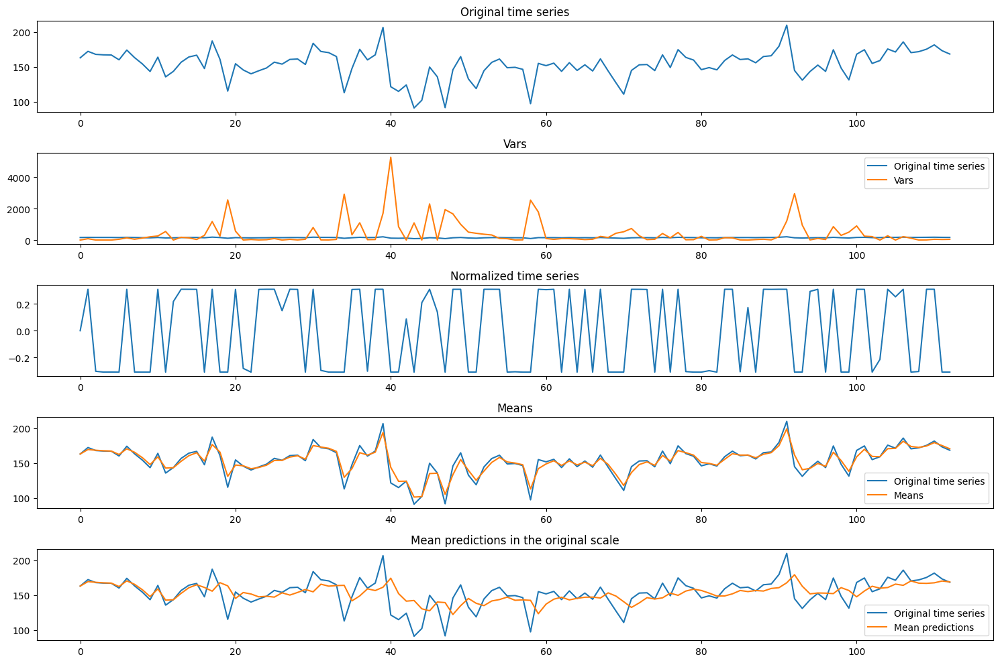

In [20]:
ts_index = 15

# create a subfigure with 5 plots in each: 
# - the original time series, 
# - the normalized time series, 
# - the original time series with its means,
# - the original time series with its vars,
# - the original time series with the predictions

fig, axs = plt.subplots(5, 1, figsize=(15, 10))
axs[0].plot(list(dataset.test)[ts_index]['target'])
axs[0].set_title('Original time series')

axs[1].plot(list(dataset.test)[ts_index]['target'])
axs[1].plot(vars[ts_index])
axs[1].set_title('Vars')
axs[1].legend(['Original time series', 'Vars'])

axs[2].plot(norm_ts[ts_index])
axs[2].set_title('Normalized time series')

axs[3].plot(list(dataset.test)[ts_index]['target'])
axs[3].plot(means[ts_index])
axs[3].set_title('Means')
axs[3].legend(['Original time series', 'Means'])

axs[4].plot(list(dataset.test)[ts_index]['target'])
axs[4].plot(predictions[ts_index])
axs[4].set_title('Mean predictions in the original scale')
axs[4].legend(['Original time series', 'Mean predictions'])

plt.tight_layout()
plt.show()

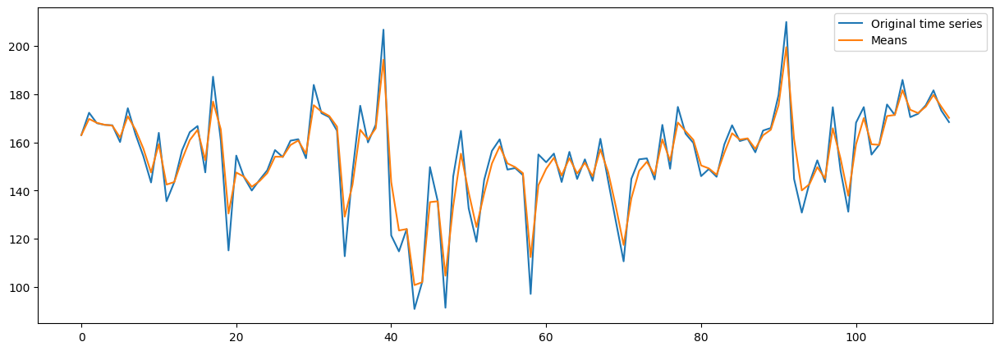

In [21]:
plt.figure(figsize=(15, 5))
plt.plot(list(dataset.test)[ts_index]['target'])
plt.plot(norm_ts[ts_index] + means[ts_index])
plt.legend(['Original time series', 'Means'])
plt.show()

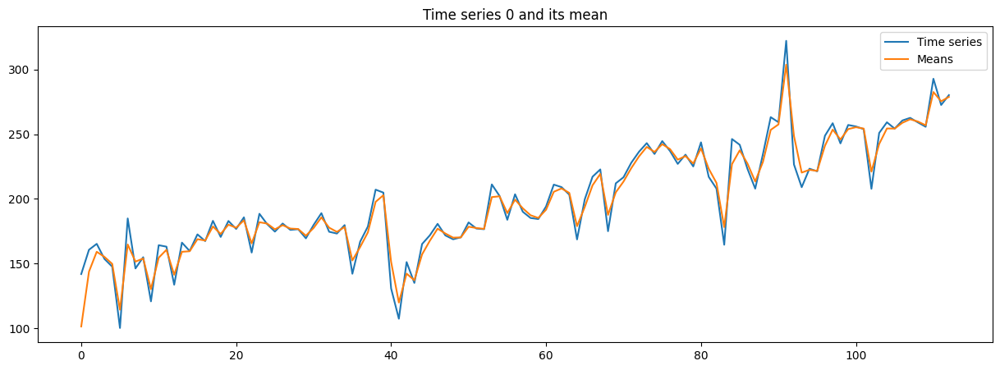

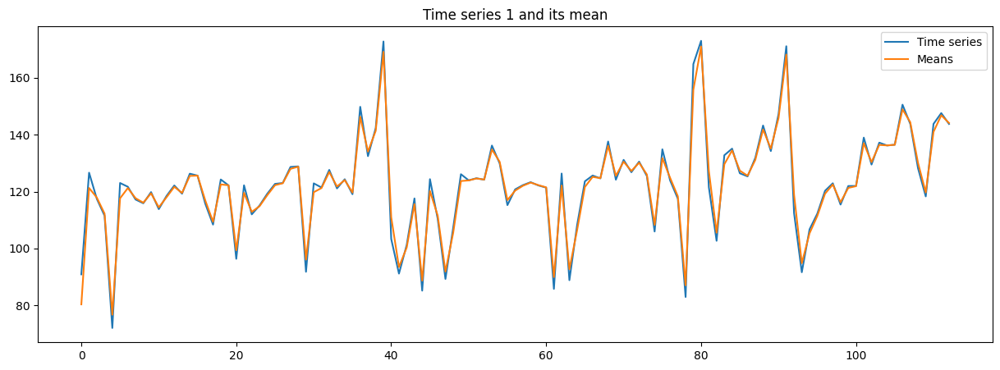

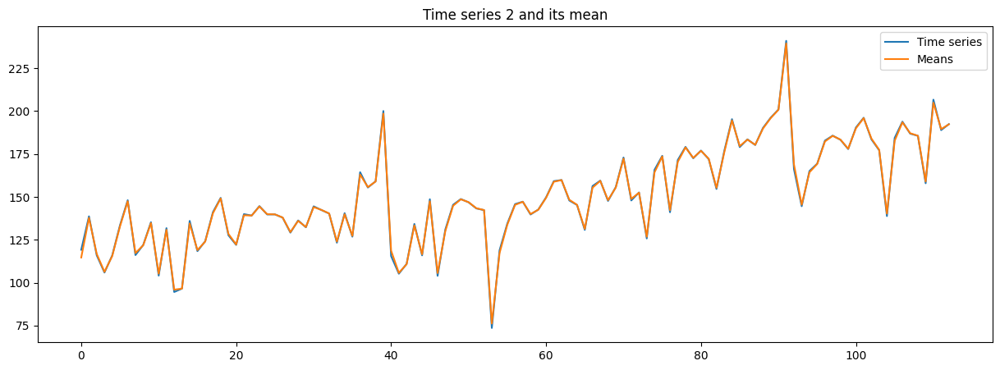

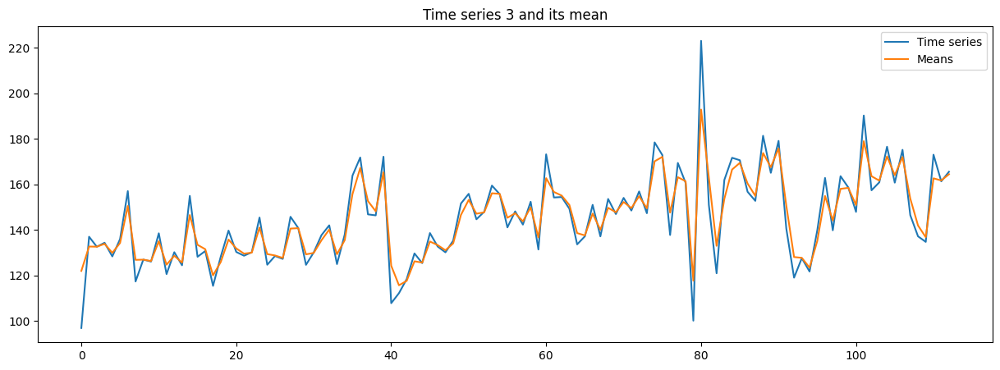

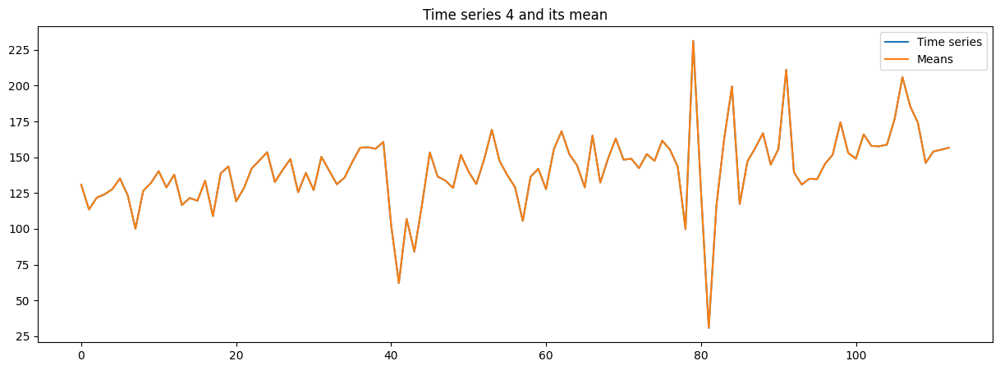

...

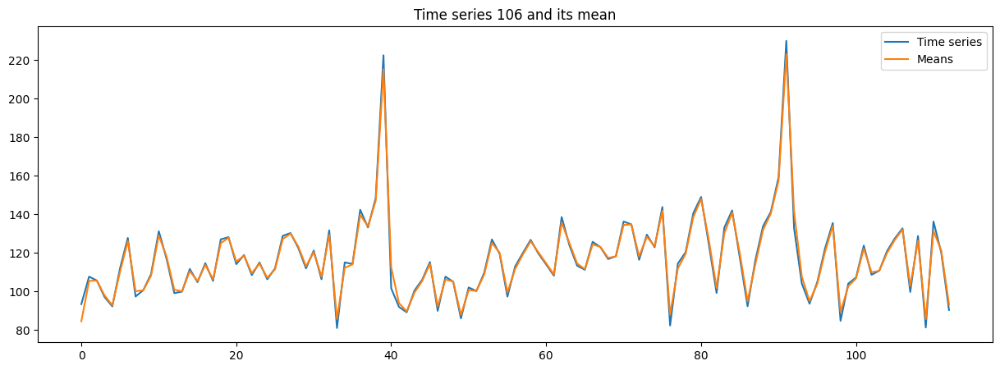

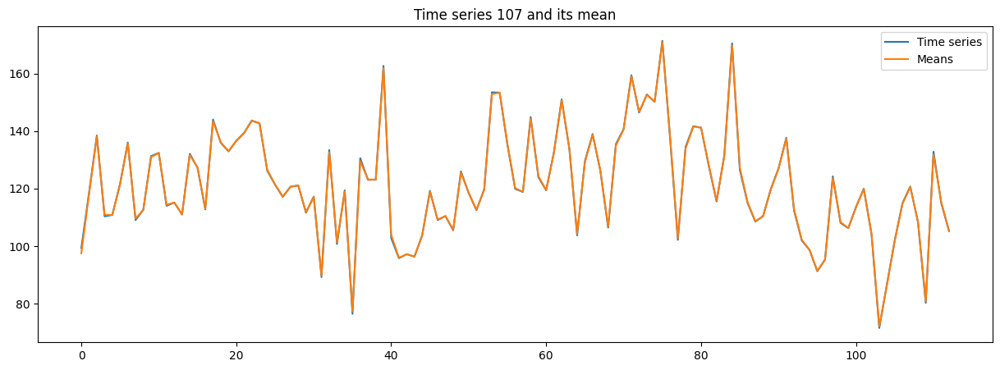

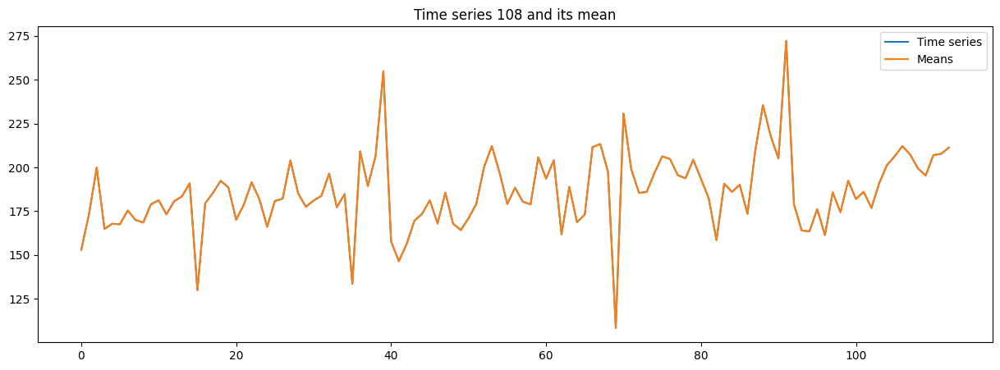

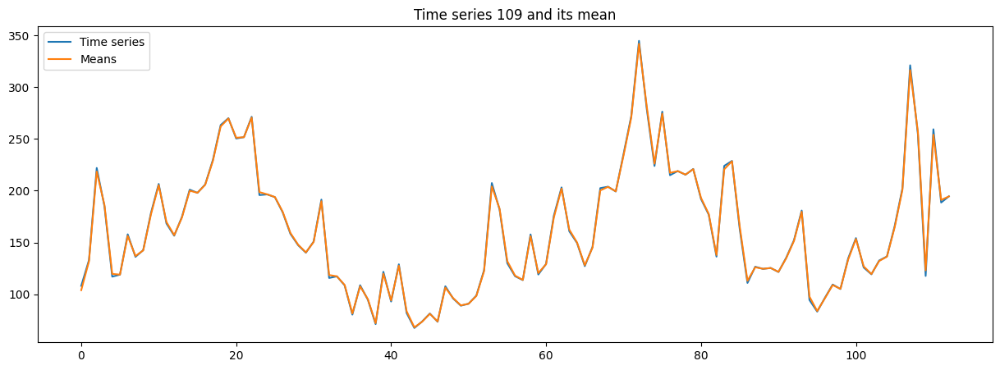

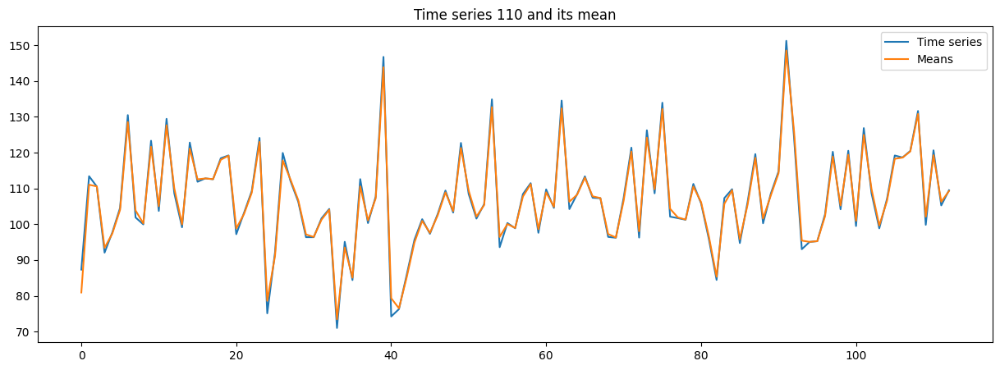

In [22]:
for i, (mean, ts) in enumerate(zip(means, dataset.test)):
    plt.figure(figsize=(15, 5))
    plt.plot(ts['target'])
    plt.plot(mean)
    plt.legend(['Time series', 'Means'])
    plt.title(f'Time series {i} and its mean')
    plt.show()